In [63]:
import pandas as pd
import numpy as np
import json
import re 
import sys
import itertools
import cv2
from PIL import Image

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler
#from skimage import io
import matplotlib.pyplot as plt


import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth
import spotipy.util as util

import warnings
warnings.filterwarnings("ignore")

In [64]:
%matplotlib inline

In [65]:
#another useful command to make data exploration easier
# NOTE: if you are using a massive dataset, this could slow down your code. 
pd.set_option('display.max_columns', None)
pd.set_option("display.max_rows", None)

In [66]:
df = pd.read_csv("D:/millenia project/kaggleMusicMoodFinal.csv")

In [67]:
df=df.sample(200,random_state=1)

In [68]:
df

,Unnamed: 0.1,Unnamed: 0,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidates_genre_lists,Mood
4485,4519,4519,0.9610,1998,0.006290,['Zaza'],0.564,299933,0.97100,0,16211VKpjM4Hh3MfIlcu4s,0.132000,9,0.2230,-5.338,0,LOVE & MONEY,44,28-10-1998,0.0362,155.437,['Zaza'],[],['Zaza'],ZazaLOVE & MONEY,[],Happy
70033,70119,70119,0.3320,1933,0.994000,['Lucille Bogan'],0.536,173933,0.09610,0,3Eh7cs650irTvCQ0UgoHqx,0.000000,5,0.1330,-9.847,1,Boogan Ways Blues,3,1933,0.0545,84.944,['Lucille Bogan'],[],['Lucille Bogan'],Lucille BoganBoogan Ways Blues,"['country_blues', 'traditional_blues']",Sad
73337,73423,73423,0.2060,1955,0.783000,['Little Jimmy Scott'],0.413,194973,0.11500,0,2DZga5wXyb0e7FchyDZS6V,0.000000,7,0.2120,-12.309,1,Recess In Heaven,2,23-06-1955,0.0334,90.809,['Little Jimmy Scott'],[],['Little Jimmy Scott'],Little Jimmy ScottRecess In Heaven,[],Sad
14093,14130,14130,0.4750,1962,0.275000,['Tommy Roe'],0.422,127067,0.57500,0,5Mzu8smN6fRBCaUaTytD1W,0.000000,4,0.0620,-8.993,1,Sheila,40,01-01-1962,0.1070,135.630,['Tommy Roe'],[],['Tommy Roe'],Tommy RoeSheila,"['folk_rock', 'brill_building_pop', 'classic_u...",Energetic
49740,49793,49793,0.7710,2011,0.020400,['Peter Bjorn and John'],0.587,252853,0.96500,0,2p5ieZMPXzUSec8yaiGTvY,0.002960,7,0.0970,-1.542,1,Second Chance,42,29-03-2011,0.0885,132.826,['Peter Bjorn and John'],[],['Peter Bjorn and John'],Peter Bjorn and JohnSecond Chance,"['alternative_dance', 'indie_pop', 'modern_roc...",Energetic
89240,89329,89329,0.3710,1975,0.518000,['Jimmy Helms'],0.394,220333,0.49800,0,6LJTUYVS8x17a34FC73L8Y,0.052100,5,0.3870,-10.321,1,Gonna Make You An Offer You Can't Refuse,40,01-01-1975,0.0383,141.816,['Jimmy Helms'],[],['Jimmy Helms'],Jimmy HelmsGonna Make You An Offer You Can't R...,[],Sad
144138,144299,144299,0.4250,1937,0.987000,['Bibbo'],0.345,200520,0.21600,0,3AACkO2hil4vcHNgJqKyYw,0.185000,5,0.2570,-10.867,0,Sansar Ho Prem Ka Mandir,0,31-12-1937,0.0532,75.866,['Bibbo'],[],['Bibbo'],BibboSansar Ho Prem Ka Mandir,[],Sad
147490,147655,147655,0.9130,1999,0.104000,['B*Witched'],0.693,172067,0.93800,0,2NNiZ5qwYIKAwjbHJsxtAO,0.000161,7,0.0685,-4.854,1,C'est La Vie,36,12-02-1999,0.0296,108.986,['B*Witched'],[],['B*Witched'],B*WitchedC'est La Vie,"['bubblegum_dance', 'dance_pop', 'girl_group',...",Happy
127736,127889,127889,0.0429,1967,0.948000,"['Daniel Barenboim', 'John Williams', 'English...",0.281,688747,0.11900,0,3GARCst0vFrQ0lTDOoqgeb,0.927000,11,0.0972,-17.683,0,Concierto de Aranjuez: II. Adagio,25,1967,0.0452,83.608,"['Daniel Barenboim', 'John Williams', 'English...",[],"['Daniel Barenboim', 'John Williams', 'English...",Daniel BarenboimConcierto de Aranjuez: II. Adagio,"['british_orchestra', 'soundtrack', 'classical...",Calm
152780,152947,152947,0.9060,1993,0.777000,['Alejandro Fernández'],0.711,125293,0.38000,0,5wiJrkz3ykFXvfew9OreEd,0.000000,10,0.2250,-10.494,1,Cascos Ligeros,31,13-04-1993,0.0453,113.703,['Alejandro Fernández'],[],['Alejandro Fernández'],Alejandro FernándezCascos Ligeros,"['regional_mexican', 'latin_arena_pop', 'latin...",Sad


In [69]:
spotify_df = df.copy()

In [70]:
float_cols = spotify_df.dtypes[spotify_df.dtypes == 'float64'].index.values

In [71]:
spotify_df.shape

(200, 27)

In [72]:
spotify_df.shape

(200, 27)

In [73]:
ohe_cols = 'popularity'

In [74]:
# create 5 point buckets for popularity 
spotify_df['bucket_popularity'] = spotify_df['popularity'].apply(lambda x: int(x/5))

In [75]:
spotify_df['consolidates_genre_lists_upd'] = spotify_df['consolidates_genre_lists'].apply(lambda x: [re.sub(' ','_',i) for i in re.findall(r"'([^']*)'", x)])

In [76]:
spotify_df.head()

,Unnamed: 0.1,Unnamed: 0,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidates_genre_lists,Mood,bucket_popularity,consolidates_genre_lists_upd
4485,4519,4519,0.961,1998,0.00629,['Zaza'],0.564,299933,0.9710,0,16211VKpjM4Hh3MfIlcu4s,0.13200,9,0.223,-5.338,0,LOVE & MONEY,44,28-10-1998,0.0362,155.437,['Zaza'],[],['Zaza'],ZazaLOVE & MONEY,[],Happy,8,[]
70033,70119,70119,0.332,1933,0.99400,['Lucille Bogan'],0.536,173933,0.0961,0,3Eh7cs650irTvCQ0UgoHqx,0.00000,5,0.133,-9.847,1,Boogan Ways Blues,3,1933,0.0545,84.944,['Lucille Bogan'],[],['Lucille Bogan'],Lucille BoganBoogan Ways Blues,"['country_blues', 'traditional_blues']",Sad,0,"[country_blues, traditional_blues]"
73337,73423,73423,0.206,1955,0.78300,['Little Jimmy Scott'],0.413,194973,0.1150,0,2DZga5wXyb0e7FchyDZS6V,0.00000,7,0.212,-12.309,1,Recess In Heaven,2,23-06-1955,0.0334,90.809,['Little Jimmy Scott'],[],['Little Jimmy Scott'],Little Jimmy ScottRecess In Heaven,[],Sad,0,[]
14093,14130,14130,0.475,1962,0.27500,['Tommy Roe'],0.422,127067,0.5750,0,5Mzu8smN6fRBCaUaTytD1W,0.00000,4,0.062,-8.993,1,Sheila,40,01-01-1962,0.1070,135.630,['Tommy Roe'],[],['Tommy Roe'],Tommy RoeSheila,"['folk_rock', 'brill_building_pop', 'classic_u...",Energetic,8,"[folk_rock, brill_building_pop, classic_uk_pop..."
49740,49793,49793,0.771,2011,0.02040,['Peter Bjorn and John'],0.587,252853,0.9650,0,2p5ieZMPXzUSec8yaiGTvY,0.00296,7,0.097,-1.542,1,Second Chance,42,29-03-2011,0.0885,132.826,['Peter Bjorn and John'],[],['Peter Bjorn and John'],Peter Bjorn and JohnSecond Chance,"['alternative_dance', 'indie_pop', 'modern_roc...",Energetic,8,"[alternative_dance, indie_pop, modern_rock, sw..."


In [77]:
#simple function to create OHE features
#this gets passed later on
def One_Hot_Encode_Prep(df, column, new_name): 
   
    tf_df = pd.get_dummies(df[column])
    feature_names = tf_df.columns
    tf_df.columns = [new_name + "|" + str(i) for i in feature_names]
    tf_df.reset_index(drop = True, inplace = True)    
    return tf_df



#function to build entire feature set
def Feature_Set_Using_TDiDF(df, float_cols):
    """ 
    Process spotify df to create a final set of features that will be used to generate recommendations

    Parameters: 
        df (pandas dataframe): Spotify Dataframe
        float_cols (list(str)): List of float columns that will be scaled 
        
    Returns: 
        final: final set of features 
    """
    #simple function to create OHE features
#this gets passed later on
def One_Hot_Encode_Prep(df, column, new_name): 
   
    
    tf_df = pd.get_dummies(df[column])
    feature_names = tf_df.columns
    tf_df.columns = [new_name + "|" + str(i) for i in feature_names]
    tf_df.reset_index(drop = True, inplace = True)    
    return tf_df



#function to build entire feature set
def Feature_Set_Using_TDiDF(df, float_cols):
   
    
    #tfidf genre lists
    tfidf = TfidfVectorizer()
    tfidf_matrix =  tfidf.fit_transform(df['consolidates_genre_lists_upd'].apply(lambda x: " ".join(x)))
    genre_df = pd.DataFrame(tfidf_matrix.toarray())
    genre_df.columns = ['genre' + "|" + i for i in tfidf.get_feature_names_out()]
    genre_df.reset_index(drop = True, inplace=True)

    #explicity_ohe = One_Hot_Encode_Prep(df, 'explicit','exp')    
    year_ohe = One_Hot_Encode_Prep(df, 'year','year') * 0.5
    popularity_ohe = One_Hot_Encode_Prep(df, 'bucket_popularity','pop') * 0.15

    #scale float columns
    floats = df[float_cols].reset_index(drop = True)
    scaler = MinMaxScaler()
    floats_scaled = pd.DataFrame(scaler.fit_transform(floats), columns = floats.columns) * 0.2

    #concanenate all features
    final = pd.concat([genre_df, floats_scaled, popularity_ohe, year_ohe], axis = 1)
     
    #add song id
    final['id']=df['id'].values
    return final

def Get_Spotify_Playlist_DataFrame(playlist_name,id_dic, df,sp):
    """ 
    Pull songs from a specific playlist.

    Parameters: 
        playlist_name (str): name of the playlist you'd like to pull from the spotify API
        id_dic (dic): dictionary that maps playlist_name to playlist_id
        df (pandas dataframe): spotify datafram
        
    Returns: 
        playlist: all songs in the playlist THAT ARE AVAILABLE IN THE KAGGLE DATASET
    """
    
    #generate playlist dataframe
    playlist = pd.DataFrame()
    playlist_name = playlist_name
    
    #print(len(sp.playlist(id_dic[playlist_name])['tracks']['items']))

    for ix, i in enumerate(sp.playlist(id_dic[playlist_name])['tracks']['items']):
        #print(i['track']['artists'][0]['name'])
        playlist.loc[ix, 'artist'] = i['track']['artists'][0]['name']
        playlist.loc[ix, 'name'] = i['track']['name']
        playlist.loc[ix, 'id'] = i['track']['id'] # ['uri'].split(':')[2]
        playlist.loc[ix, 'url'] = i['track']['album']['images'][1]['url']
        playlist.loc[ix, 'date_added'] = i['added_at']
    
    
    playlist['date_added'] = pd.to_datetime(playlist['date_added'])  
    
    #playlist = playlist[playlist['id'].isin(df['id'].values)].sort_values('date_added',ascending = False)
    
    return playlist

In [78]:
import skimage
import requests
from io import BytesIO

def visualize_songs(df):
    temp = df['url'].values
    plt.figure(figsize=(15,int(0.625 * len(temp))))
    columns = 5
    for i,url in enumerate(temp):
        x = url 
        print(x)
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        plt.imshow(img)
        plt.show()


In [79]:
def generate_playlist_feature(complete_feature_set, playlist_df, weight_factor):
    
    
    playlist_features_in_dataframe = complete_feature_set[complete_feature_set['id'].isin(playlist_df['id'].values)]#.drop('id', axis = 1).mean(axis =0)
    playlist_features_in_dataframe = playlist_features_in_dataframe.merge(playlist_df[['id','date_added']], on = 'id', how = 'inner')
    playlist_features_not_in_dataframe = complete_feature_set[~complete_feature_set['id'].isin(playlist_df['id'].values)]#.drop('id', axis = 1)
    
    playlist_feature_set = playlist_features_in_dataframe.sort_values('date_added',ascending=False)
    most_recent_date = playlist_feature_set.iloc[0,-1]
    
    for ix, row in playlist_feature_set.iterrows():
        playlist_feature_set.loc[ix,'months_from_recent'] = int((most_recent_date.to_pydatetime() - row.iloc[-1].to_pydatetime()).days / 30)
        
    playlist_feature_set['weight'] = playlist_feature_set['months_from_recent'].apply(lambda x: weight_factor ** (-x))
    
    playlist_feature_set_weighted = playlist_feature_set.copy()
    #print(playlist_feature_set_weighted.iloc[:,:-4].columns)
    playlist_feature_set_weighted.update(playlist_feature_set_weighted.iloc[:,:-4].mul(playlist_feature_set_weighted.weight,0))
    playlist_feature_set_weighted_final = playlist_feature_set_weighted.iloc[:, :-4]
    #playlist_feature_set_weighted_final['id'] = playlist_feature_set['id']
    
    return playlist_feature_set_weighted_final.sum(axis = 0), playlist_features_not_in_dataframe


def Recommend_Playlist(df, features, nonplaylist_features):
   
    
    non_playlist_df = df[df['id'].isin(nonplaylist_features['id'].values)]
    non_playlist_df['sim'] = cosine_similarity(nonplaylist_features.drop('id', axis = 1).values, features.values.reshape(1, -1))[:,0]
    non_playlist_df_top_40 = non_playlist_df.sort_values('sim',ascending = False).head(40)
    non_playlist_df_top_40['url'] = non_playlist_df_top_40['id'].apply(lambda x: sp.track(x)['album']['images'][1]['url'])
    
    return non_playlist_df_top_40

In [80]:
scope = 'user-library-read'

if len(sys.argv) > 1:
    username = sys.argv[1]
else:
    print("Usage: %s username" % (sys.argv[0],))
    sys.exit()

In [81]:
auth_manager = SpotifyClientCredentials(client_id='0ea91ef8870d4ded9bbc701ba8e847bd', client_secret='3d0c6fd8caa44e6c8b6d89828af7d495')
sp = spotipy.Spotify(auth_manager=auth_manager)

In [82]:
token = util.prompt_for_user_token(scope, client_id='0ea91ef8870d4ded9bbc701ba8e847bd', client_secret='3d0c6fd8caa44e6c8b6d89828af7d495', redirect_uri='http://localhost:8891/')

In [83]:
sp = spotipy.Spotify(auth=token)

In [84]:
# Get playlist information for the current user
id_name = {}
list_photo = {}
for i in sp.current_user_playlists()['items']:
    id_name[i['name']] = i['uri'].split(':')[2]
    if i['images']:
        list_photo[i['uri'].split(':')[2]] = i['images'][0]['url']
    else:
        list_photo[i['uri'].split(':')[2]] = None


In [85]:
id_name

{'New songs': '27gg1BIrQCd7A5H7uUNW2G',
 'EDM': '7FV9cUcM5xF6DTMmRaeytK',
 'Edm': '2iMeRjmeJmj7l17pf8HJac',
 'Calm': '2OV1V2AecDHh91wrNyn7L1',
 'Angry': '12SVXpuIXw56IKoBjme1uU',
 'Sad': '4HLLhv1AOHM5AFajgnOn92',
 'Happy': '1JzmCQ30ncLWPhKrlHuiwP',
 'Meloo💕': '5reTXGkfKfBpbrIVMMbXym',
 'My Playlist #2': '0OF74Zjxidv3fHeGCBLfPa',
 'Fav': '5KoYnHEwlDXAaHEYaUGbmG'}

In [86]:
# get first key using dictionary indexing
first_key = list(id_name.keys())[0]
first_key

'New songs'

In [87]:
def ChooseDataset(x):
    if x == "Disgust":
        return spotify_df[spotify_df['Mood'].isin(['Energetic', 'Happy', 'Calm'])]
    if x == "Neutral":
        return spotify_df[spotify_df['Mood'].isin(['Calm'])]
    if x == "Angry":
        return spotify_df[spotify_df['Mood'].isin(['Energetic', 'Calm'])]
    if x == "Fear":
        return spotify_df[spotify_df['Mood'].isin(['Happy', 'Calm'])]
    if x == "Happy":
        return spotify_df[spotify_df['Mood'].isin(['Sad', 'Happy', 'Calm'])]
    if x == "Sad":
        return spotify_df[spotify_df['Mood'].isin(['Sad', 'Happy', 'Calm'])]
    if x == "Surprise":
        return spotify_df[spotify_df['Mood'].isin(['Energetic', 'Happy', 'Sad'])]
    return spotify_df

In [88]:
def Recommend_Top40(x):
   
    O_df = ChooseDataset(x)
    
    # Feature Engineering from main dataframe
    complete_feature_set = Feature_Set_Using_TDiDF(O_df, float_cols=float_cols)#.mean(axis = 0)
    #print("The complete feature set is:",complete_feature_set)
    # collecting spotify user playlist dataframe
    one_playlist_from_spotify = Get_Spotify_Playlist_DataFrame(first_key, id_name, O_df,sp)
    #print("The playlist dataframe is:",one_playlist_from_spotify)
    # linear vector for recommendation
    features_in_the_playlist, features_not_in_the_playlist = generate_playlist_feature(complete_feature_set, one_playlist_from_spotify, 1.09)
    
    
    # Recommended Songs store here
    top40_recommendation = Recommend_Playlist(spotify_df, features_in_the_playlist, features_not_in_the_playlist)
    
    print("The top 40 recommendation is:",top40_recommendation)
    visualize_songs(top40_recommendation)
    

In [89]:
import sys 
import cv2
from deepface import DeepFace

def imageToMoodDetection():
    cascPath = sys.argv[1]
    faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    font = cv2.FONT_HERSHEY_PLAIN

    video_capture = cv2.VideoCapture(0)

    while True:
        # Capture frame-by-frame
        ret, frame = video_capture.read()

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        faces = faceCascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4, flags=cv2.CASCADE_SCALE_IMAGE)
        

        # Draw a rectangle around the faces
        for x,y,w,h in faces:
            roi_gray = gray[y:y+h, x:x+w]
            roi_color = frame[y:y+h, x:x+w]
            cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 0), 2)
            facess = faceCascade.detectMultiScale(roi_gray)
            if len(facess) == 0:
                print("Face not detected")
            else:
                for (ex,ey,ew,eh) in facess:
                    face_roi = roi_color[ey: ey+eh, ex:ex + ew] ## cropping the face
                    
                final_image =cv2.resize(face_roi, (224,224))
                #final_image = np.expand_dims(final_image,axis =0) ## need fourth dimension
                final_image=final_image/255.0
                analyze = DeepFace.analyze(final_image, actions = ['emotion'],enforce_detection=False)
                cv2.putText(frame, analyze[0]['dominant_emotion'], 
                            (100, 250), font,
                            2, (0, 255, 255),
                            1, cv2.LINE_AA)
                cv2.imshow('Video', frame)
                                        
        
        font = cv2.FONT_HERSHEY_PLAIN                                         
        analyze = DeepFace.analyze(frame, actions = ['emotion'],enforce_detection=False)
        cv2.putText(frame, analyze[0]['dominant_emotion'], 
                            (100, 250), font,
                            2, (0, 255, 255),
                            1, cv2.LINE_AA)
        cv2.imshow('Video', frame)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # When everything is done, release the capture
    video_capture.release()
    cv2.destroyAllWindows()

    if analyze is not None:
         print((analyze[0]['dominant_emotion']))
         return(analyze[0]['dominant_emotion'])

Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 15.97it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 16.70it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 17.54it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 18.77it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 18.27it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 17.28it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 21.01it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 19.60it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 19.06it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 16.72it/s]


Face not detected


Action: emotion: 100%|██████████| 1/1 [00:00<00:00, 19.60it/s]


sad
The top 40 recommendation is:         Unnamed: 0.1  Unnamed: 0  valence  year  acousticness  \
23616          23660       23660    0.810  1964       0.09610   
143463        143624      143624    0.806  1955       0.60800   
11391          11425       11425    0.697  1955       0.41700   
137452        137610      137610    0.802  1969       0.70800   
76394          76481       76481    0.883  1947       0.93900   
56940          57009       57009    0.910  1959       0.53800   
145802        145963      145963    0.331  1975       0.82400   
106557        106665      106665    0.748  1956       0.30000   
14223          14260       14260    0.823  1952       0.70500   
137499        137657      137657    0.781  1986       0.82300   
141658        141819      141819    0.519  1991       0.97600   
58842          58927       58927    0.799  1940       0.99500   
122223        122331      122331    0.637  1955       0.92600   
124060        124187      124187    0.224  1960       0.

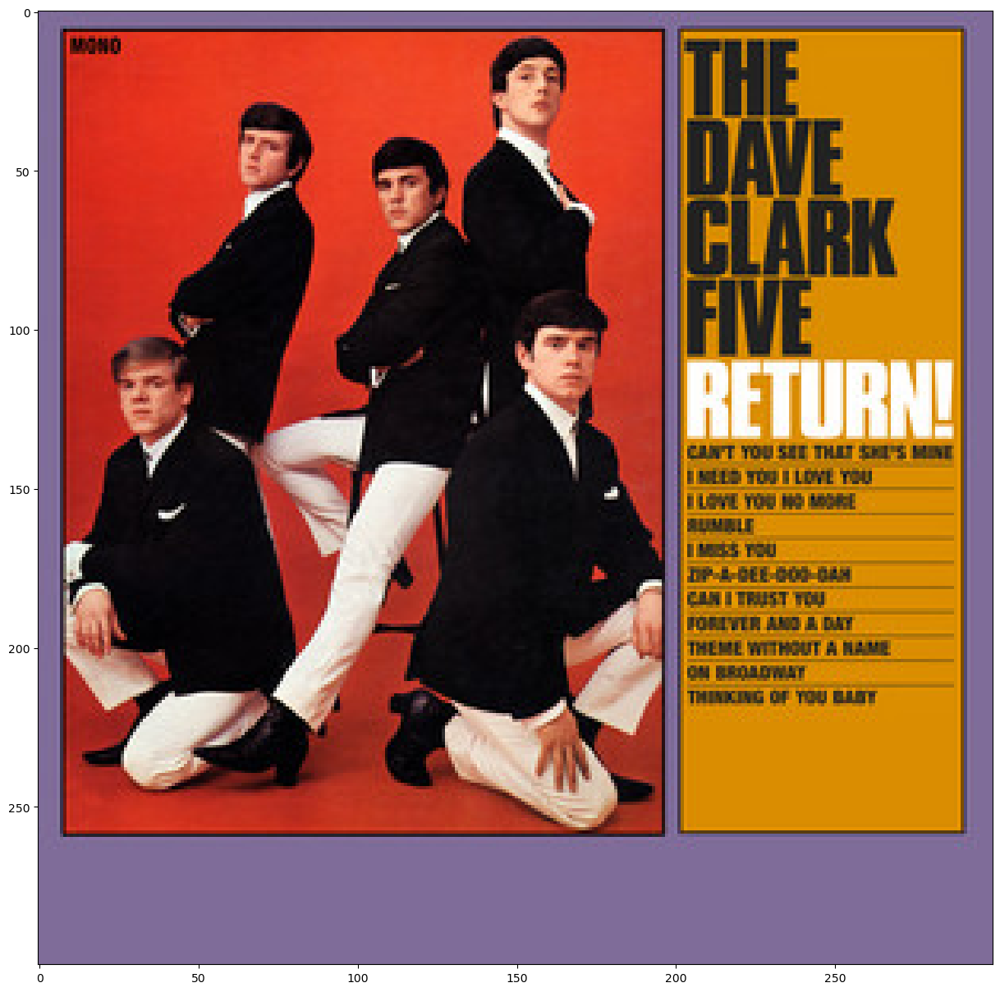

https://i.scdn.co/image/ab67616d00001e029060a2c0a01366ee03274597


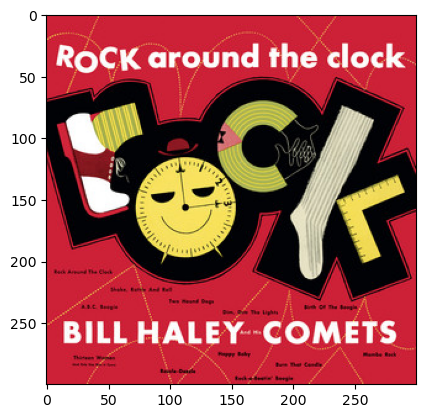

https://i.scdn.co/image/ab67616d00001e0243335fe086644b29b9e6f77c


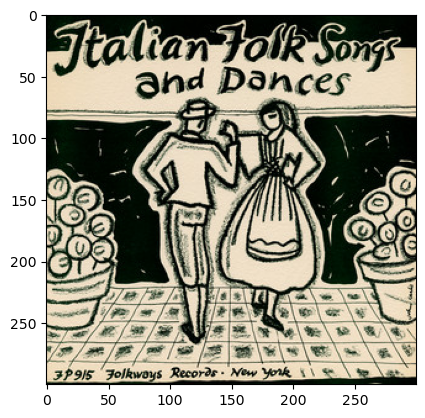

https://i.scdn.co/image/ab67616d00001e02581fc8f440e1d3257d40586a


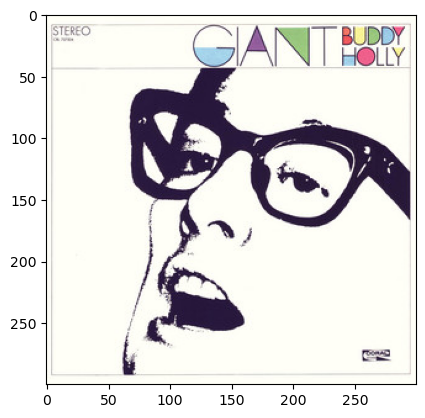

https://i.scdn.co/image/ab67616d00001e02a0b6e84914b0d55f3e7c6895


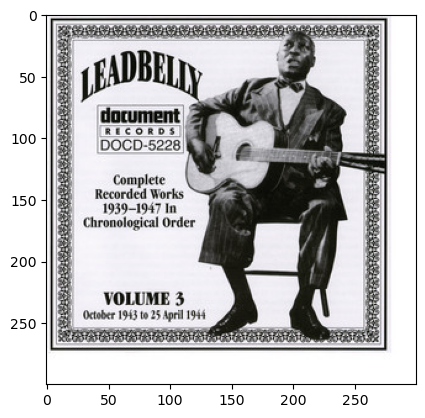

https://i.scdn.co/image/ab67616d00001e023843b432892fdff0ffd2c96d


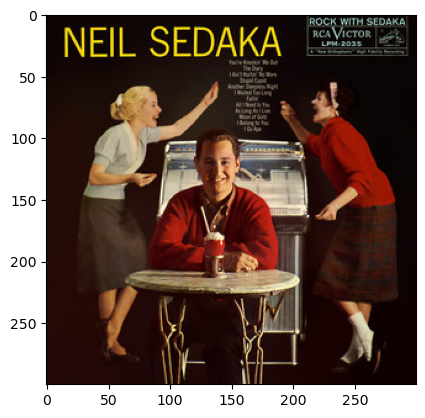

https://i.scdn.co/image/ab67616d00001e020ff44a187d8d229cb5f20057


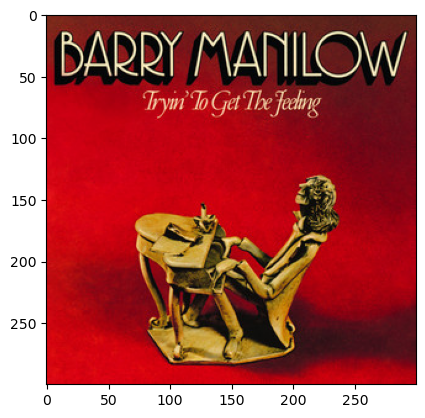

https://i.scdn.co/image/ab67616d00001e02fa26ff635848babc9fe3320c


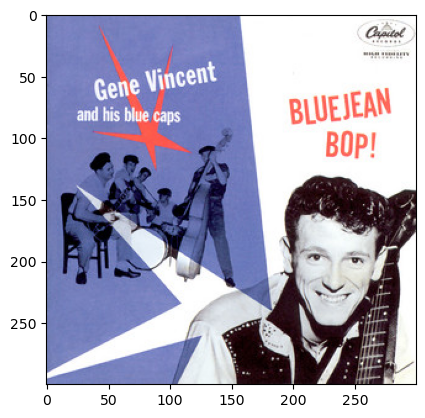

https://i.scdn.co/image/ab67616d00001e02500e800c8e013da279aff4f9


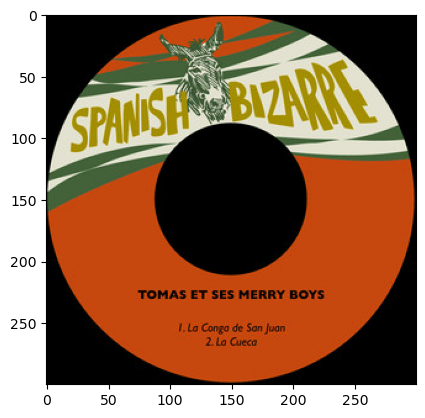

https://i.scdn.co/image/ab67616d00001e02e604552845ff5dc2ef96598e


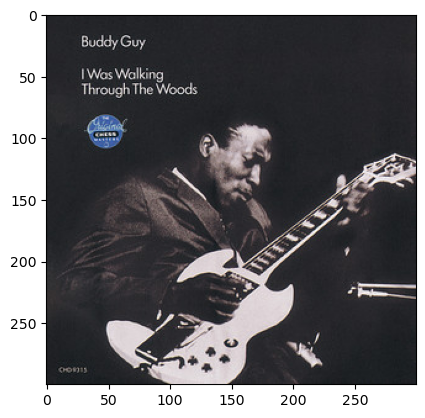

https://i.scdn.co/image/ab67616d00001e029b9ef0b1afb0e2f857acc09d


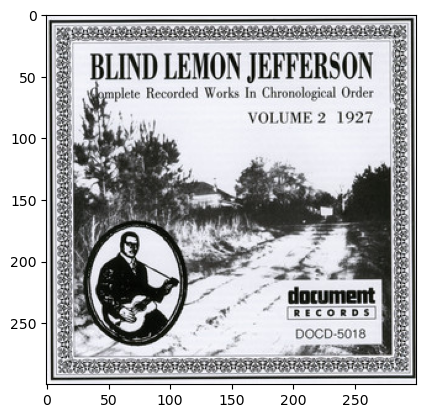

https://i.scdn.co/image/ab67616d00001e02594e28f496c38147728bee1d


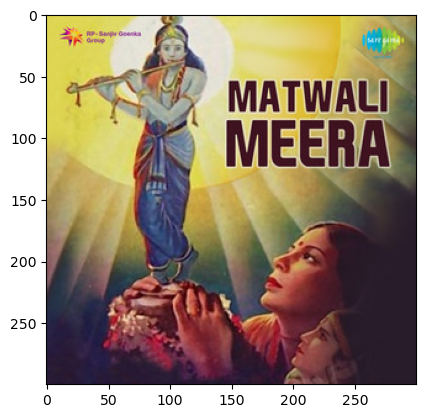

https://i.scdn.co/image/ab67616d00001e025f12ec1a05dec3c5a5fba44d


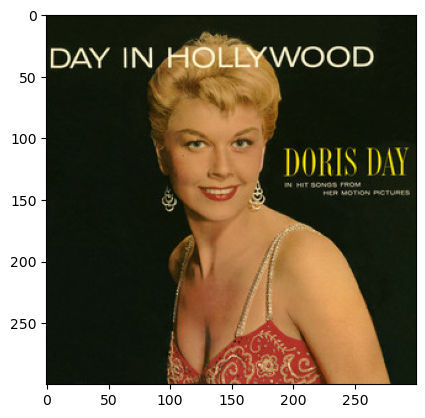

https://i.scdn.co/image/ab67616d00001e0242f5ba45e767d2c157ce2ec4


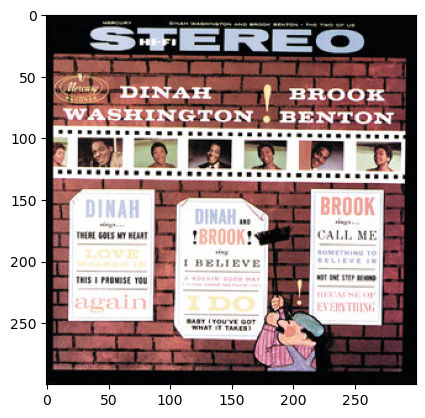

https://i.scdn.co/image/ab67616d00001e02fa054c4805e9898130cf4e8d


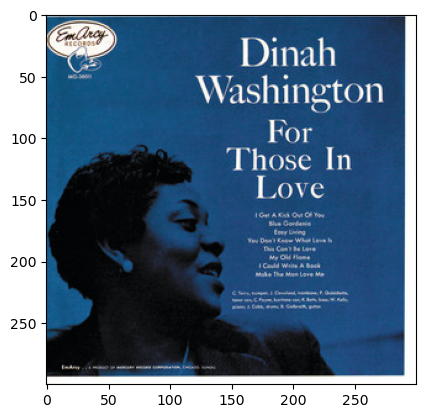

https://i.scdn.co/image/ab67616d00001e02de55afc35f648f98613caf4c


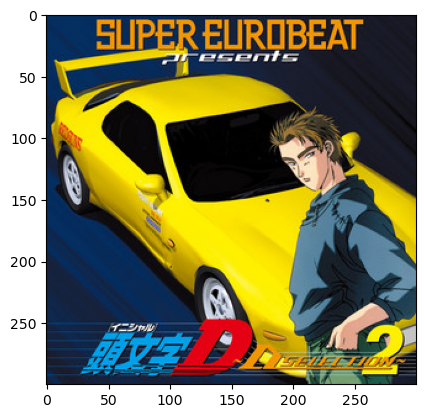

https://i.scdn.co/image/ab67616d00001e02cda392903e47d759ad292db3


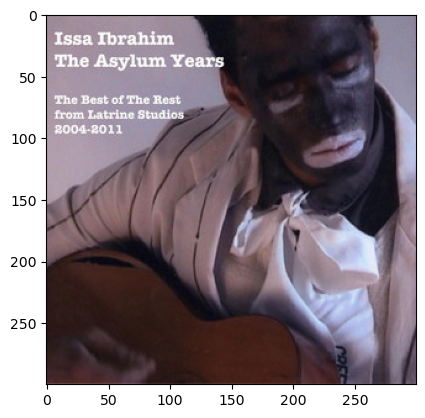

https://i.scdn.co/image/ab67616d00001e02236b72fc5f5071c0084e703a


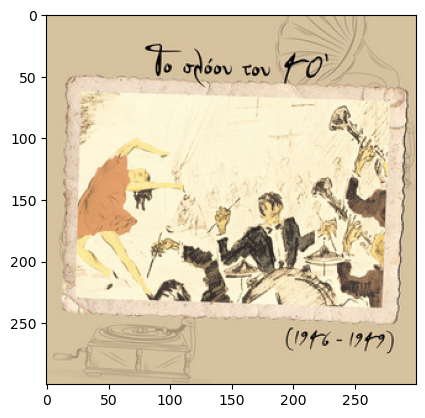

https://i.scdn.co/image/ab67616d00001e025d75bd98d107456d5422e418


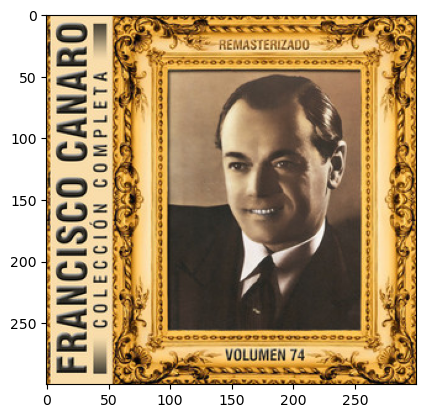

https://i.scdn.co/image/ab67616d00001e02876a515ef329e370e9aa227b


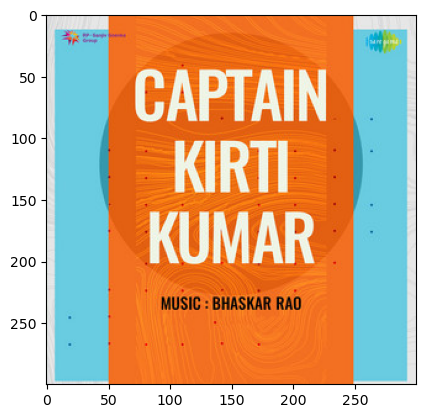

https://i.scdn.co/image/ab67616d00001e02c960663f0391639533f88e28


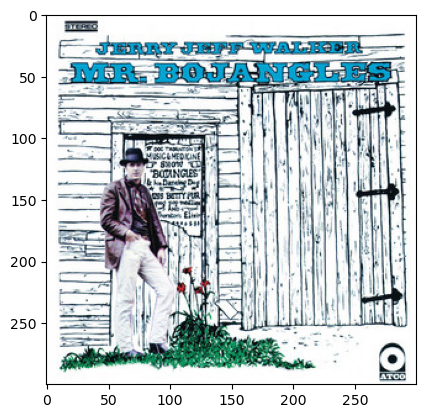

https://i.scdn.co/image/ab67616d00001e021bc8f101ff5b16349c74b4c5


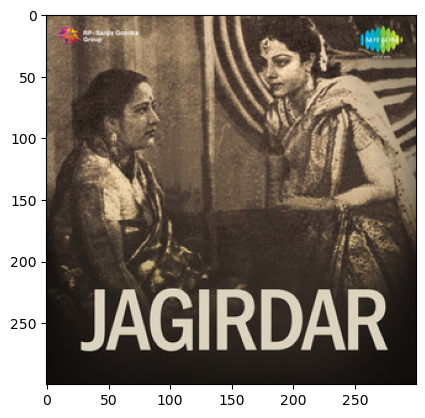

https://i.scdn.co/image/ab67616d00001e0231f73f8ad55ec862209ceeb4


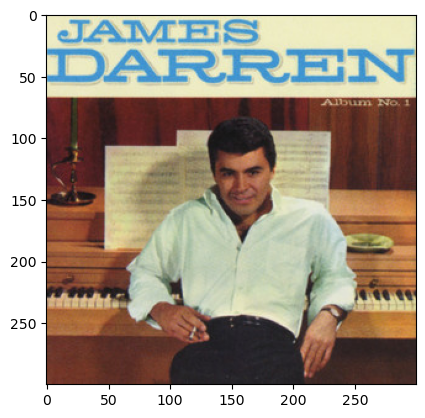

https://i.scdn.co/image/ab67616d00001e02a28c2f671e3666851e718f80


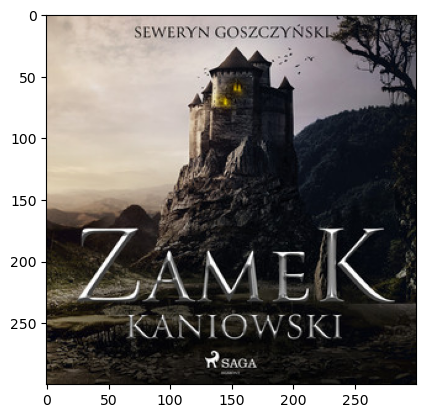

https://i.scdn.co/image/ab67616d00001e02a1563303154ba4e132767bc9


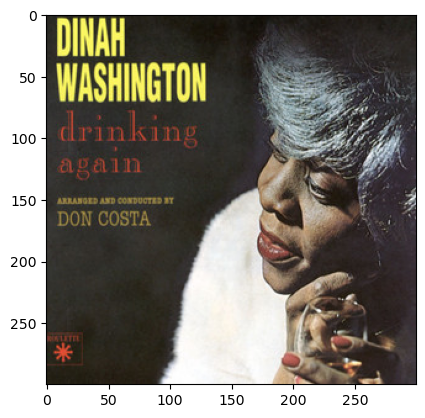

https://i.scdn.co/image/ab67616d00001e024df5b571de1c3f8ba2f02386


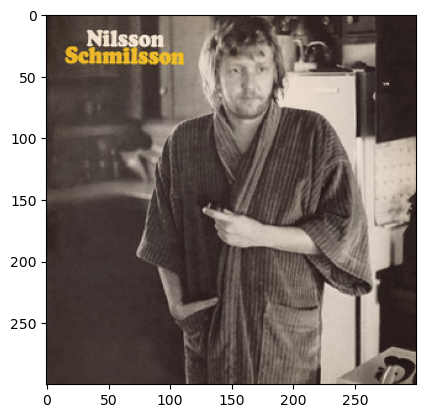

https://i.scdn.co/image/ab67616d00001e02efec330941556e231d3b7b95


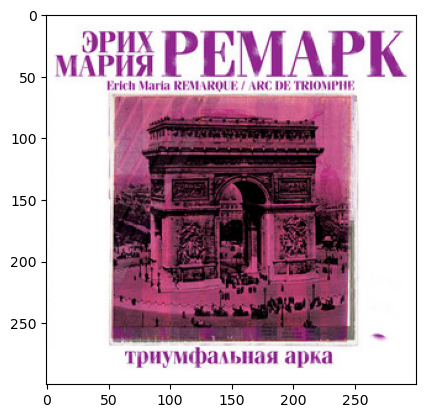

https://i.scdn.co/image/ab67616d00001e028ef917f14341624a737663e7


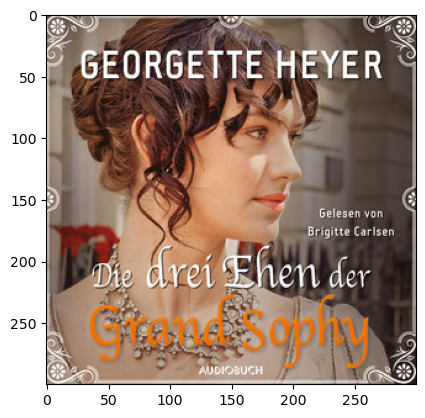

https://i.scdn.co/image/ab67616d00001e02890ac5a778c8e837c115e094


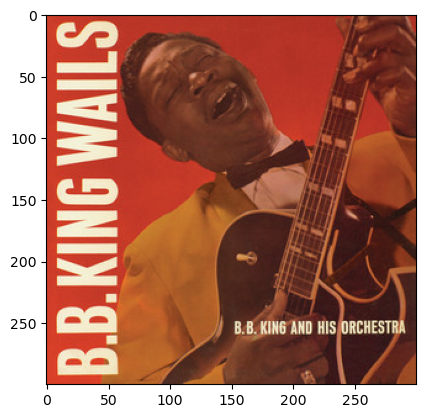

https://i.scdn.co/image/ab67616d00001e0215e0013385ebbdc779584b38


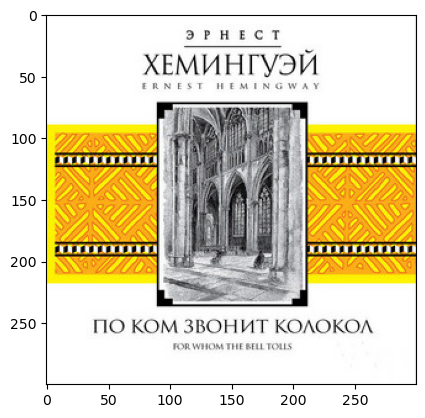

https://i.scdn.co/image/ab67616d00001e02773c978c2e5c32ecf2550bbd


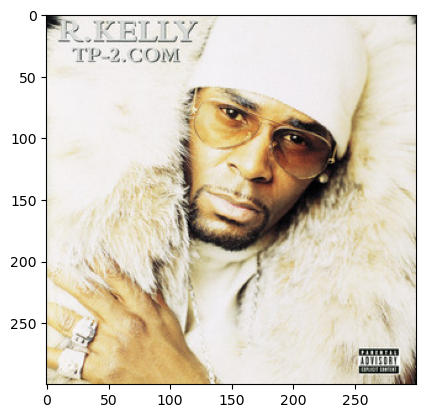

https://i.scdn.co/image/ab67616d00001e0213f61b73b155d49c9ad671b9


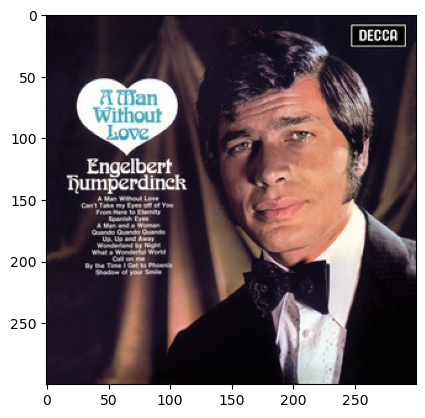

https://i.scdn.co/image/ab67616d00001e024ce8b4e42588bf18182a1ad2


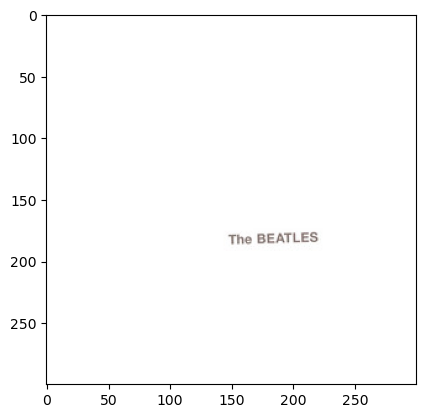

https://i.scdn.co/image/ab67616d00001e02d7cd250c7962ca169a082263


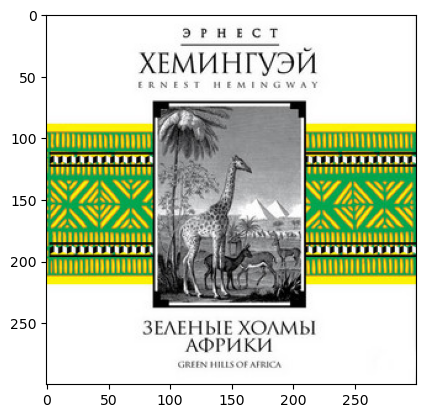

https://i.scdn.co/image/ab67616d00001e02eae9db1a32df86a7cd53dbf4


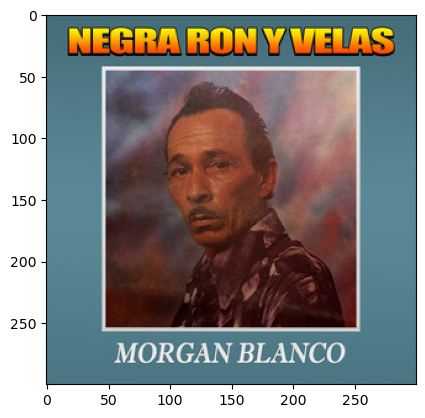

https://i.scdn.co/image/ab67616d00001e021882bb790ff01387342c9750


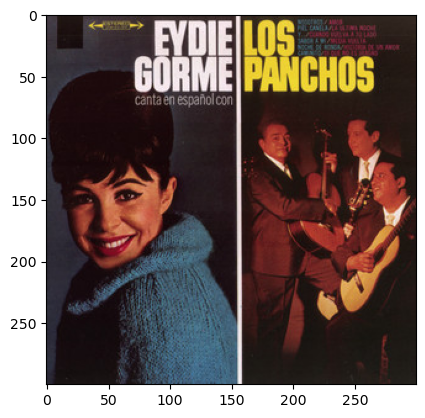

https://i.scdn.co/image/ab67616d00001e02875dadce06e61fceee98fe77


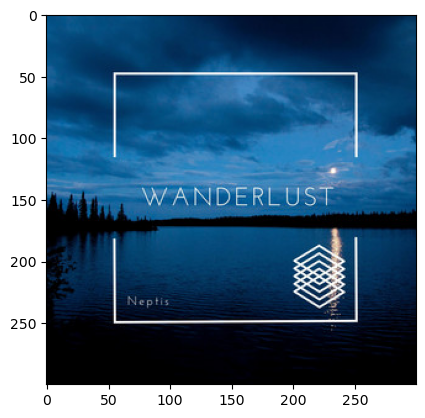

https://i.scdn.co/image/ab67616d00001e022279928c12edae1ccafb4cf3


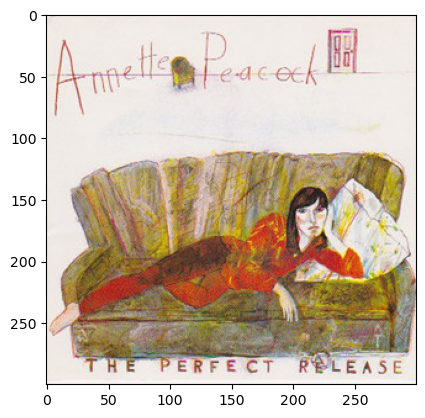

https://i.scdn.co/image/ab67616d00001e029d35b400e0dc059848288420


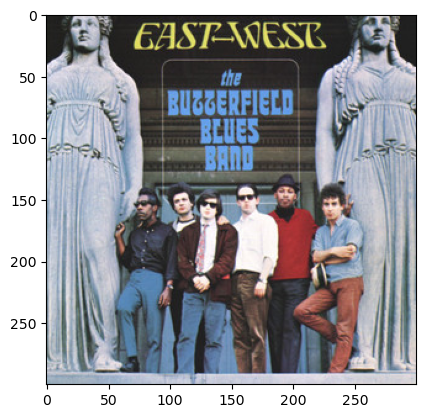

https://i.scdn.co/image/ab67616d00001e02c2e72df29ae73d349d44d5a0


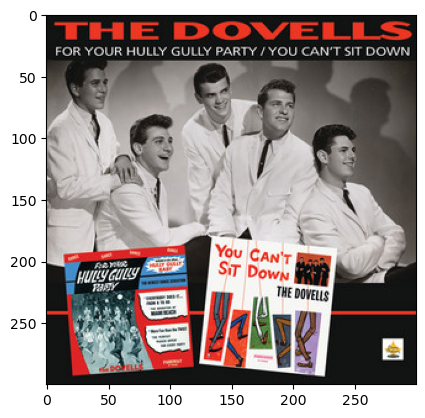

In [90]:
Recommend_Top40(imageToMoodDetection())